<a href="https://colab.research.google.com/github/MikeHE1/Mask-RCNN-pytorch/blob/Mask-RCNN-pytorch-MasterMHE/project_mealworm_segmentation_V3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TorchVision Instance Segmentation Finetuning Tutorial

For this tutorial, we will be finetuning a pre-trained [Mask R-CNN](https://arxiv.org/abs/1703.06870) model in the [*Penn-Fudan Database for Pedestrian Detection and Segmentation*](https://www.cis.upenn.edu/~jshi/ped_html/). It contains 170 images with 345 instances of pedestrians, and we will use it to illustrate how to use the new features in torchvision in order to train an instance segmentation model on a custom dataset.

First, we need to install `pycocotools`. This library will be used for computing the evaluation metrics following the COCO metric for intersection over union.

In [20]:
%%shell

pip install cython
# Install pycocotools, the version by default in Colab
# has a bug fixed in https://github.com/cocodataset/cocoapi/pull/354
pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-5de_e9lv
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-5de_e9lv
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done


## Defining the Dataset

The [torchvision reference scripts for training object detection, instance segmentation and person keypoint detection](https://github.com/pytorch/vision/tree/v0.3.0/references/detection) allows for easily supporting adding new custom datasets.
The dataset should inherit from the standard `torch.utils.data.Dataset` class, and implement `__len__` and `__getitem__`.

The only specificity that we require is that the dataset `__getitem__` should return:

* image: a PIL Image of size (H, W)
* target: a dict containing the following fields
    * `boxes` (`FloatTensor[N, 4]`): the coordinates of the `N` bounding boxes in `[x0, y0, x1, y1]` format, ranging from `0` to `W` and `0` to `H`
    * `labels` (`Int64Tensor[N]`): the label for each bounding box
    * `image_id` (`Int64Tensor[1]`): an image identifier. It should be unique between all the images in the dataset, and is used during evaluation
    * `area` (`Tensor[N]`): The area of the bounding box. This is used during evaluation with the COCO metric, to separate the metric scores between small, medium and large boxes.
    * `iscrowd` (`UInt8Tensor[N]`): instances with `iscrowd=True` will be ignored during evaluation.
    * (optionally) `masks` (`UInt8Tensor[N, H, W]`): The segmentation masks for each one of the objects
    * (optionally) `keypoints` (`FloatTensor[N, K, 3]`): For each one of the `N` objects, it contains the `K` keypoints in `[x, y, visibility]` format, defining the object. `visibility=0` means that the keypoint is not visible. Note that for data augmentation, the notion of flipping a keypoint is dependent on the data representation, and you should probably adapt `references/detection/transforms.py` for your new keypoint representation

If your model returns the above methods, they will make it work for both training and evaluation, and will use the evaluation scripts from pycocotools.


One note on the labels. The model considers class 0 as background. If your dataset does not contain the background class, you should not have 0 in your labels. For example, assuming you have just two classes, cat and dog, you can define 1 (not 0) to represent cats and 2 to represent dogs. So, for instance, if one of the images has both classes, your labels tensor should look like [1,2].

Additionally, if you want to use aspect ratio grouping during training (so that each batch only contains images with similar aspect ratio), then it is recommended to also implement a `get_height_and_width` method, which returns the height and the width of the image. If this method is not provided, we query all elements of the dataset via `__getitem__` , which loads the image in memory and is slower than if a custom method is provided.


### **Using Penn-Fudan dataset from Google Drive**

In [21]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [22]:
import sys
# Set datasetSize BIG or SMALL
datasetSize = "SMALL"

if datasetSize == "BIG":
  path_MealwormDataset = "/content/drive/MyDrive/Colab Notebooks/Mask-RCNN-pytorch-MasterMHE/datasets/Mealworm-Semantic-Segmentation/"
else:
  path_MealwormDataset = "/content/drive/MyDrive/Colab Notebooks/Mask-RCNN-pytorch-MasterMHE/datasets/Mealworm-Semantic-Segmentation-SMALL/"
!pwd

/content


In [23]:
print(f"path_MealwormDataset:  {path_MealwormDataset}")

path_MealwormDataset:  /content/drive/MyDrive/Colab Notebooks/Mask-RCNN-pytorch-MasterMHE/datasets/Mealworm-Semantic-Segmentation-SMALL/


### Writing a custom dataset for Penn-Fudan

Let's write a dataset for the Penn-Fudan dataset.

Dateset has been copied to Google Drive from: https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip

Let's have a look at the dataset and how it is layed down.

The data is structured as follows
```
PennFudanPed/
  PedMasks/
    FudanPed00001_mask.png
    FudanPed00002_mask.png
    FudanPed00003_mask.png
    FudanPed00004_mask.png
    ...
  PNGImages/
    FudanPed00001.png
    FudanPed00002.png
    FudanPed00003.png
    FudanPed00004.png
```

Here is one example of an image in the dataset, with its corresponding instance segmentation mask

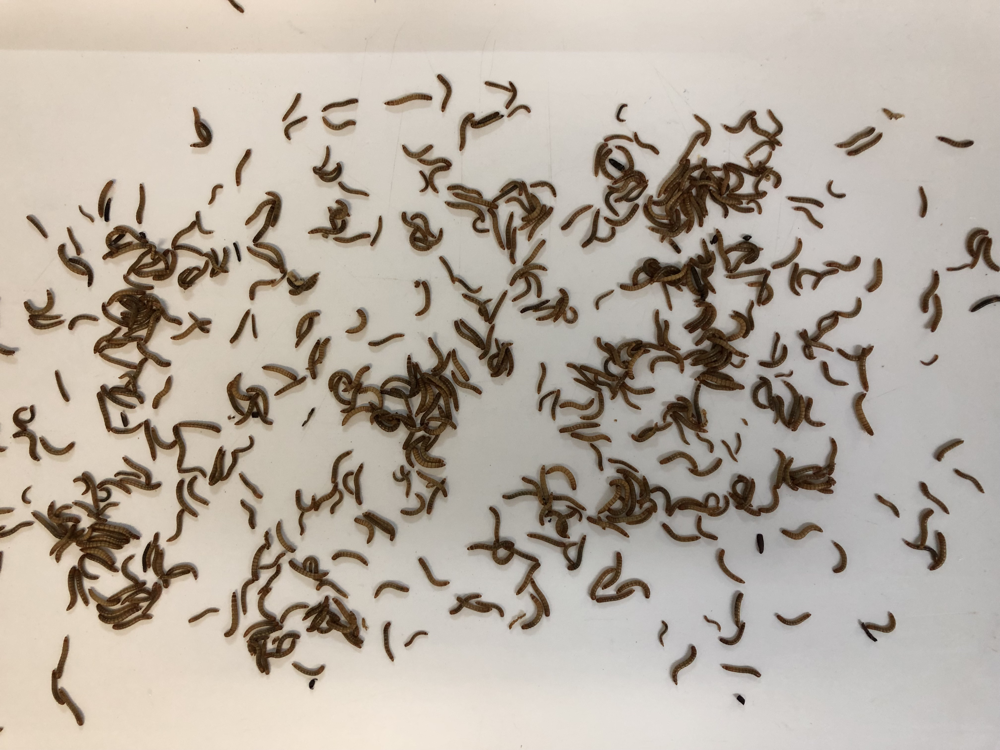

In [24]:
from PIL import Image
Image.open(path_MealwormDataset + 'Images/IMG_6674.JPG')

# **Return a random color mask for each instance**

From site: https://haochen23.github.io/2020/05/instance-segmentation-mask-rcnn.html#.Y-jqVi_71Qg


In [25]:
def get_coloured_mask(mask):
  """
  random_colour_masks
    parameters:
      - image - predicted masks
    method:
      - the masks of each predicted object is given random colour for visualization
  """
  colours = [[0, 255, 0],[0, 0, 255],[255, 0, 0],[0, 255, 255],[255, 255, 0],[255, 0, 255],[80, 70, 180],[250, 80, 190],[245, 145, 50],[70, 150, 250],[50, 190, 190]]
  r = np.zeros_like(mask).astype(np.uint8)
  g = np.zeros_like(mask).astype(np.uint8)
  b = np.zeros_like(mask).astype(np.uint8)
  r[mask == 1], g[mask == 1], b[mask == 1] = colours[random.randrange(0,10)]
  coloured_mask = np.stack([r, g, b], axis=2)
  return coloured_mask

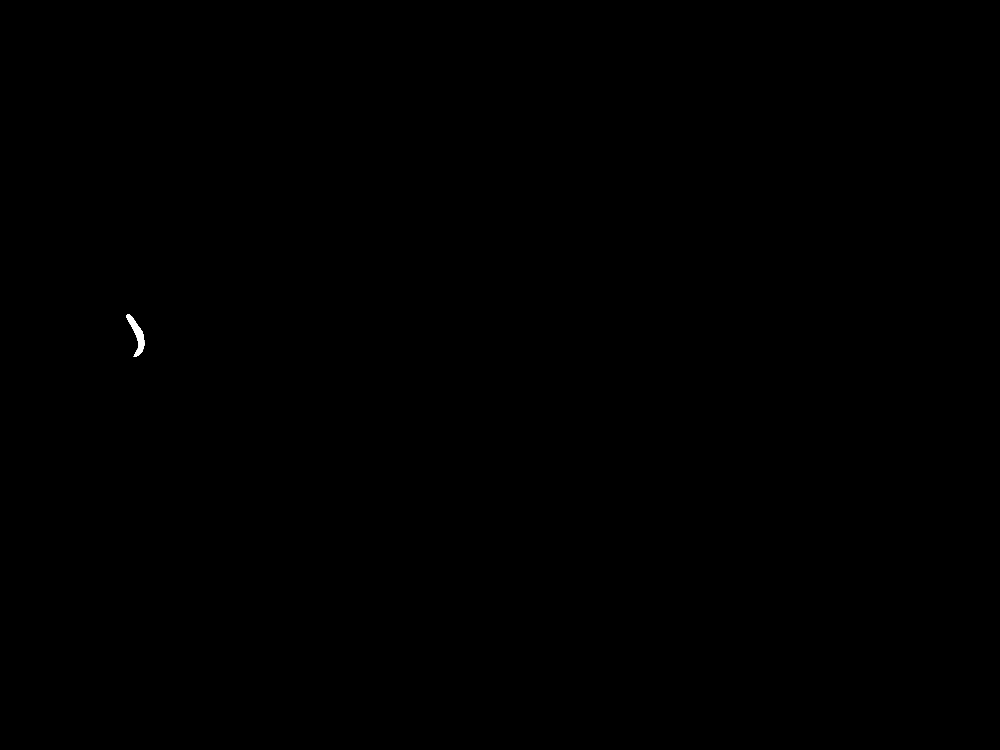

In [26]:
mask = Image.open(path_MealwormDataset + 'mealwormlarvae-mask/masks/IMG_6674_00000.png')
mask

So each image has a corresponding segmentation mask, where each color correspond to a different instance. Let's write a `torch.utils.data.Dataset` class for this dataset.

That's all for the dataset. Let's see how the outputs are structured for this dataset

In [92]:
import os
import numpy as np
import torch
import torch.utils.data
from PIL import Image
import cv2


class MealwormDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "Images"))))
        print(f"List self.imgs: {self.imgs}")
        self.masks = list(sorted(os.listdir(os.path.join(root, "mealwormlarvae-mask/masks"))))
        print(f"List self.masks: {self.masks}")

        self.dictImgsMasks = {}
        self.dictImgsMasks["imgs"] = self.imgs
        print(f"self.dictImgsMasks : {self.dictImgsMasks}")
        
        # Iterate in all the images in the self.imgs list
        for i in range(len(self.dictImgsMasks["imgs"])):
          #print(f"item: {i}")
          nameImage = self.dictImgsMasks["imgs"][i]
          # Strip the extension from the filename
          nameImageNoExt = self.dictImgsMasks["imgs"][i][:-4]
          # print(f"nameImage: {nameImage}")
          # print(f"nameImageNoExt: {nameImageNoExt}")
          
          # For all the mask file associated with the image (that contains the name of the image in the image name...) add it to the list
          listMaskfilename = []
          for j in range(len(self.masks)):
            if nameImageNoExt in self.masks[j]:
              # print(f"true")
              listMaskfilename.append(self.masks[j])
              #print(f"listMaskfilename: {listMaskfilename}")

          # Add the list of mask to the image key in the dictionaty self.dictImgsMasks
          self.dictImgsMasks[nameImage] = listMaskfilename
        
        # print(f"self.dictImgsMasks : {self.dictImgsMasks}")





    def __getitem__(self, idx):
        # load images ad masks
        # This will load the image at the idx position..
        # For the masks, will need to:
        # 1- Extract the image number from the file name
        # 2- lists all the masks that are referring to the image being currently loaded
        # 
        img_path = os.path.join(self.root, "Images", self.imgs[idx])
        img = Image.open(img_path).convert("RGB")
        print(f"img datatype: {type(img)}")
        image_filename = img_path
        imagefilenameNoPath = self.imgs[idx]
        
        # Will iterate through the dictionary of self.dictImgsMasks to load all the masks associated with an image
        # idx will be the key since this is what is passed to the __getitem__ method
        print(f"idx: {idx}")
        print(f"image_filename: {image_filename}")
        print(f"imagefilenameNoPath: {imagefilenameNoPath}")

        print(f"self.dictImgsMasks - mask for the image: {self.dictImgsMasks[imagefilenameNoPath]}")
        numberOfMaskForImage = len(self.dictImgsMasks[imagefilenameNoPath])
        mask_filename = self.dictImgsMasks[imagefilenameNoPath]
        print(f"numberOfMaskForImage: {imagefilenameNoPath} is {numberOfMaskForImage}")

        # boxes = []
        # Already putting boxes in tensor... need to remove conversion below
        boxes = torch.zeros([numberOfMaskForImage,4], dtype=torch.float32)
        masks = []

        for i in range(numberOfMaskForImage):
          maskFileNameLoop = self.dictImgsMasks[imagefilenameNoPath][i]
          print(f"mask file name: {maskFileNameLoop}")
          mask_path = os.path.join(self.root, "mealwormlarvae-mask/masks", maskFileNameLoop)

          # note that we haven't converted the mask to RGB,
          # because each color corresponds to a different instance
          # with 0 being background
          mask = Image.open(mask_path)
          print(f"mask datatype: {type(mask)}")
          mask = np.array(mask)
          print(f"+-+-+-+- mask datatype np.array: {type(mask)}")
          # instances are encoded as different colors
          obj_ids = np.unique(mask)
          print(f"obj_ids: {obj_ids}")
          print(f"mask obj_ids: {type(obj_ids)}")
          # first id is the background, so remove it
          obj_ids = obj_ids[1:]
          print(f"mask obj_ids after remove background: {type(obj_ids)}")
          print(f"obj_ids  after remove background: {obj_ids}")

          # split the color-encoded mask into a set
          # of binary masks
          masks = mask == obj_ids[:, None, None]
          print(f"RURURURU masks: {masks}")
          print(f"RURURURU masks type: {type(masks)}")
          print(f"XOXOXOXO masks: {mask}")
          print(f"XOXOXOXO masks type: {type(mask)}")
          #masks = np.append(masks, mask,axis = 1)
          #masks.append(mask)
          print(f"***** masks: {masks}")
          print(f"***** masks type: {type(masks)}")
          # numpy.array(lst)



          cv2Mask = cv2.imread(mask_path)
          cv2Mask = (cv2Mask > 0).astype(np.uint8) 

          # boxes = torch.zeros([num_objs,4], dtype=torch.float32)
          # for i in range(num_objs):
          # -------------
          x,y,w,h = cv2.boundingRect(cv2Mask)
          print(f"x: {x}, x: {y}, x: {w}, x: {h}")
          boxes[i] = torch.tensor([x, y, x+w, y+h])
          # -------------
          # boxes.append = torch.tensor([x, y, x+w, y+h])

          # get bounding box coordinates for each mask
          # pos = np.where(masks[i])
          # print(f"pos: {pos}")  
          # xmin = np.min(mask[1])
          # xmax = np.max(mask[1])
          # ymin = np.min(mask[0])
          # ymax = np.max(mask[0])
          # boxes.append([xmin, ymin, xmax, ymax]) 
          # print(f"xmin: {xmin}, xmax: {ymin}, x: {xmax}, x: {ymax}") 

          


        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        labels = torch.ones((numberOfMaskForImage,), dtype=torch.int64)
        masks = torch.as_tensor(masks, dtype=torch.uint8)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((numberOfMaskForImage,), dtype=torch.int64)

        print(f"Bumber of boxes: {len(boxes)}")
        print(f"Bumber of labels: {len(labels)}")
        print(f"Bumber of masks: {len(masks)}")
        

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["masks"] = masks
        target["image_id"] = image_id
        target["image_name"] = image_filename
        target["mask_name"] = mask_filename
        target["object_id"] = obj_ids
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.imgs)

In [93]:
dataset = MealwormDataset(path_MealwormDataset)
print(f"Dataset Length: {len(dataset)}")
dataset[0]

List self.imgs: ['IMG_6674.JPG', 'IMG_6677.JPG', 'IMG_6680.JPG', 'IMG_6681.JPG', 'IMG_6682.JPG', 'IMG_6683.JPG', 'IMG_6684.JPG']
List self.masks: ['IMG_6674_00000.png', 'IMG_6674_00001.png', 'IMG_6674_00002.png', 'IMG_6674_00003.png', 'IMG_6674_00004.png', 'IMG_6677_00000.png', 'IMG_6677_00001.png', 'IMG_6677_00002.png', 'IMG_6677_00003.png', 'IMG_6677_00004.png', 'IMG_6680_00000.png', 'IMG_6680_00001.png', 'IMG_6680_00002.png', 'IMG_6680_00003.png', 'IMG_6680_00004.png', 'IMG_6681_00000.png', 'IMG_6681_00001.png', 'IMG_6681_00002.png', 'IMG_6681_00003.png', 'IMG_6681_00004.png', 'IMG_6682_00000.png', 'IMG_6682_00001.png', 'IMG_6682_00002.png', 'IMG_6682_00003.png', 'IMG_6682_00004.png', 'IMG_6683_00000.png', 'IMG_6683_00001.png', 'IMG_6683_00002.png', 'IMG_6683_00003.png', 'IMG_6683_00004.png', 'IMG_6684_00000.png', 'IMG_6684_00001.png', 'IMG_6684_00002.png', 'IMG_6684_00003.png', 'IMG_6684_00004.png']
self.dictImgsMasks : {'imgs': ['IMG_6674.JPG', 'IMG_6677.JPG', 'IMG_6680.JPG', 'IMG

error: ignored

So we can see that by default, the dataset returns a `PIL.Image` and a dictionary
containing several fields, including `boxes`, `labels` and `masks`.

## Defining your model

In this tutorial, we will be using [Mask R-CNN](https://arxiv.org/abs/1703.06870), which is based on top of [Faster R-CNN](https://arxiv.org/abs/1506.01497). Faster R-CNN is a model that predicts both bounding boxes and class scores for potential objects in the image.

![Faster R-CNN](https://raw.githubusercontent.com/pytorch/vision/temp-tutorial/tutorials/tv_image03.png)

Mask R-CNN adds an extra branch into Faster R-CNN, which also predicts segmentation masks for each instance.

![Mask R-CNN](https://raw.githubusercontent.com/pytorch/vision/temp-tutorial/tutorials/tv_image04.png)

There are two common situations where one might want to modify one of the available models in torchvision modelzoo.
The first is when we want to start from a pre-trained model, and just finetune the last layer. The other is when we want to replace the backbone of the model with a different one (for faster predictions, for example).

Let's go see how we would do one or another in the following sections.


### 1 - Finetuning from a pretrained model

Let's suppose that you want to start from a model pre-trained on COCO and want to finetune it for your particular classes. Here is a possible way of doing it:
```
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# load a model pre-trained pre-trained on COCO
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

# replace the classifier with a new one, that has
# num_classes which is user-defined
num_classes = 2  # 1 class (person) + background
# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features
# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes) 
```

### 2 - Modifying the model to add a different backbone

Another common situation arises when the user wants to replace the backbone of a detection
model with a different one. For example, the current default backbone (ResNet-50) might be too big for some applications, and smaller models might be necessary.

Here is how we would go into leveraging the functions provided by torchvision to modify a backbone.

```
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

# load a pre-trained model for classification and return
# only the features
backbone = torchvision.models.mobilenet_v2(pretrained=True).features
# FasterRCNN needs to know the number of
# output channels in a backbone. For mobilenet_v2, it's 1280
# so we need to add it here
backbone.out_channels = 1280

# let's make the RPN generate 5 x 3 anchors per spatial
# location, with 5 different sizes and 3 different aspect
# ratios. We have a Tuple[Tuple[int]] because each feature
# map could potentially have different sizes and
# aspect ratios 
anchor_generator = AnchorGenerator(sizes=((32, 64, 128, 256, 512),),
                                   aspect_ratios=((0.5, 1.0, 2.0),))

# let's define what are the feature maps that we will
# use to perform the region of interest cropping, as well as
# the size of the crop after rescaling.
# if your backbone returns a Tensor, featmap_names is expected to
# be [0]. More generally, the backbone should return an
# OrderedDict[Tensor], and in featmap_names you can choose which
# feature maps to use.
roi_pooler = torchvision.ops.MultiScaleRoIAlign(featmap_names=[0],
                                                output_size=7,
                                                sampling_ratio=2)

# put the pieces together inside a FasterRCNN model
model = FasterRCNN(backbone,
                   num_classes=2,
                   rpn_anchor_generator=anchor_generator,
                   box_roi_pool=roi_pooler)
```

### An Instance segmentation model for PennFudan Dataset

In our case, we want to fine-tune from a pre-trained model, given that our dataset is very small. So we will be following approach number 1.

Here we want to also compute the instance segmentation masks, so we will be using Mask R-CNN:

In [60]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

      
def get_instance_segmentation_model(num_classes):
    # load an instance segmentation model pre-trained on COCO
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # now get the number of input features for the mask classifier
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    # and replace the mask predictor with a new one
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask,
                                                       hidden_layer,
                                                       num_classes)

    return model

That's it, this will make model be ready to be trained and evaluated on our custom dataset.

## Training and evaluation functions

In `references/detection/,` we have a number of helper functions to simplify training and evaluating detection models.
Here, we will use `references/detection/engine.py`, `references/detection/utils.py` and `references/detection/transforms.py`.

Let's copy those files (and their dependencies) in here so that they are available in the notebook

In [61]:
%%shell

# Download TorchVision repo to use some files from
# references/detection
git clone https://github.com/pytorch/vision.git
cd vision
git checkout v0.8.2

cp references/detection/utils.py ../
cp references/detection/transforms.py ../
cp references/detection/coco_eval.py ../
cp references/detection/engine.py ../
cp references/detection/coco_utils.py ../

fatal: destination path 'vision' already exists and is not an empty directory.
HEAD is now at 2f40a483d7 [v0.8.X] .circleci: Add Python 3.9 to CI (#3063)




Let's write some helper functions for data augmentation / transformation, which leverages the functions in `refereces/detection` that we have just copied:


In [36]:
from engine import train_one_epoch, evaluate
import utils
import transforms as T


def get_transform(train):
    transforms = []
    # converts the image, a PIL image, into a PyTorch Tensor
    transforms.append(T.ToTensor())
    if train:
        # during training, randomly flip the training images
        # and ground-truth for data augmentation
        transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)

#### Testing forward() method 

Before iterating over the dataset, it’s good to see what the model expects during training and inference time on sample data.


In [37]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
# dataset = PennFudanDataset(path_PennDudanDataset, get_transform(train=True))
dataset = MealwormDataset(path_MealwormDataset, get_transform(train=True))
data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=2, shuffle=True, num_workers=4, # change from 4 to 1 for workers, batch_size from 2 to 1
    collate_fn=utils.collate_fn
)
# For Training
images,targets = next(iter(data_loader))
images = list(image for image in images)
targets = [{k: v for k, v in t.items()} for t in targets]
output = model(images,targets)   # Returns losses and detections
# For inference
model.eval()
x = [torch.rand(3, 300, 400), torch.rand(3, 500, 400)]
predictions = model(x)           # Returns predictions



/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

List self.imgs: ['IMG_6674.JPG', 'IMG_6677.JPG', 'IMG_6680.JPG', 'IMG_6681.JPG', 'IMG_6682.JPG', 'IMG_6683.JPG', 'IMG_6684.JPG']
List self.masks: ['IMG_6674_00000.png', 'IMG_6674_00001.png', 'IMG_6674_00002.png', 'IMG_6674_00003.png', 'IMG_6674_00004.png', 'IMG_6677_00000.png', 'IMG_6677_00001.png', 'IMG_6677_00002.png', 'IMG_6677_00003.png', 'IMG_6677_00004.png', 'IMG_6680_00000.png', 'IMG_6680_00001.png', 'IMG_6680_00002.png', 'IMG_6680_00003.png', 'IMG_6680_00004.png', 'IMG_6681_00000.png', 'IMG_6681_00001.png', 'IMG_6681_00002.png', 'IMG_6681_00003.png', 'IMG_6681_00004.png', 'IMG_6682_00000.png', 'IMG_6682_00001.png', 'IMG_6682_00002.png', 'IMG_6682_00003.png', 'IMG_6682_00004.png', 'IMG_6683_00000.png', 'IMG_6683_00001.png', 'IMG_6683_00002.png', 'IMG_6683_00003.png', 'IMG_6683_00004.png', 'IMG_6684_00000.png', 'IMG_6684_00001.png', 'IMG_6684_00002.png', 'IMG_6684_00003.png', 'IMG_6684_00004.png']
self.dictImgsMasks : {'imgs': ['IMG_6674.JPG', 'IMG_6677.JPG', 'IMG_6680.JPG', 'IMG

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


idx: 0
image_filename: /content/drive/MyDrive/Colab Notebooks/Mask-RCNN-pytorch-MasterMHE/datasets/Mealworm-Semantic-Segmentation-SMALL/Images/IMG_6674.JPG
imagefilenameNoPath: IMG_6674.JPG
self.dictImgsMasks - mask for the image: ['IMG_6674_00000.png', 'IMG_6674_00001.png', 'IMG_6674_00002.png', 'IMG_6674_00003.png', 'IMG_6674_00004.png']
numberOfMaskForImage: IMG_6674.JPG is 5

mask file name: IMG_6674_00000.pngobj_ids: [  0 255]
idx: 4
x: 508, x: 1266, x: 76, x: 173
mask file name: IMG_6674_00001.png
image_filename: /content/drive/MyDrive/Colab Notebooks/Mask-RCNN-pytorch-MasterMHE/datasets/Mealworm-Semantic-Segmentation-SMALL/Images/IMG_6682.JPG
imagefilenameNoPath: IMG_6682.JPG
self.dictImgsMasks - mask for the image: ['IMG_6682_00000.png', 'IMG_6682_00001.png', 'IMG_6682_00002.png', 'IMG_6682_00003.png', 'IMG_6682_00004.png']
numberOfMaskForImage: IMG_6682.JPG is 5
mask file name: IMG_6682_00000.png
idx: 3
image_filename: /content/drive/MyDrive/Colab Notebooks/Mask-RCNN-pytorch-M

#### Note that we do not need to add a mean/std normalization nor image rescaling in the data transforms, as those are handled internally by the Mask R-CNN model.

### Putting everything together

We now have the dataset class, the models and the data transforms. Let's instantiate them

In [47]:
# use our dataset and defined transformations
# dataset = PennFudanDataset(path_PennDudanDataset, get_transform(train=True))
# dataset_test = PennFudanDataset(path_PennDudanDataset, get_transform(train=False))
dataset = MealwormDataset(path_MealwormDataset, get_transform(train=True))
dataset_test = MealwormDataset(path_MealwormDataset, get_transform(train=False))

# split the dataset in train and test set
torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()
dataset = torch.utils.data.Subset(dataset, indices[:-50])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-50:])

# define training and validation data loaders
 # num_worker=4 ... lowered to 2
data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=1, shuffle=False, num_workers=2,
    collate_fn=utils.collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=1, shuffle=False, num_workers=2,
    collate_fn=utils.collate_fn)

List self.imgs: ['IMG_6674.JPG', 'IMG_6677.JPG', 'IMG_6680.JPG', 'IMG_6681.JPG', 'IMG_6682.JPG', 'IMG_6683.JPG', 'IMG_6684.JPG']
List self.masks: ['IMG_6674_00000.png', 'IMG_6674_00001.png', 'IMG_6674_00002.png', 'IMG_6674_00003.png', 'IMG_6674_00004.png', 'IMG_6677_00000.png', 'IMG_6677_00001.png', 'IMG_6677_00002.png', 'IMG_6677_00003.png', 'IMG_6677_00004.png', 'IMG_6680_00000.png', 'IMG_6680_00001.png', 'IMG_6680_00002.png', 'IMG_6680_00003.png', 'IMG_6680_00004.png', 'IMG_6681_00000.png', 'IMG_6681_00001.png', 'IMG_6681_00002.png', 'IMG_6681_00003.png', 'IMG_6681_00004.png', 'IMG_6682_00000.png', 'IMG_6682_00001.png', 'IMG_6682_00002.png', 'IMG_6682_00003.png', 'IMG_6682_00004.png', 'IMG_6683_00000.png', 'IMG_6683_00001.png', 'IMG_6683_00002.png', 'IMG_6683_00003.png', 'IMG_6683_00004.png', 'IMG_6684_00000.png', 'IMG_6684_00001.png', 'IMG_6684_00002.png', 'IMG_6684_00003.png', 'IMG_6684_00004.png']
self.dictImgsMasks : {'imgs': ['IMG_6674.JPG', 'IMG_6677.JPG', 'IMG_6680.JPG', 'IMG


Now let's instantiate the model and the optimizer

In [48]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# our dataset has two classes only - background and person
num_classes = 2

# get the model using our helper function
model = get_instance_segmentation_model(num_classes)
# move model to the right device
model.to(device)

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

# and a learning rate scheduler which decreases the learning rate by
# 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth


  0%|          | 0.00/170M [00:00<?, ?B/s]

And now let's train the model for 10 epochs, evaluating at the end of every epoch.

In [49]:
# let's train it for 10 epochs
from torch.optim.lr_scheduler import StepLR
num_epochs = 10

for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, data_loader_test, device=device)

ZeroDivisionError: ignored

Now that training has finished, let's have a look at what it actually predicts in a test image

In [ ]:
# pick one image from the test set
img, _ = dataset_test[46]
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])

Printing the prediction shows that we have a list of dictionaries. Each element of the list corresponds to a different image. As we have a single image, there is a single dictionary in the list.
The dictionary contains the predictions for the image we passed. In this case, we can see that it contains `boxes`, `labels`, `masks` and `scores` as fields.

In [ ]:
prediction

[{'boxes': tensor([[352.8465, 102.5257, 463.4670, 376.9616]], device='cuda:0'),
  'labels': tensor([1], device='cuda:0'),
  'scores': tensor([0.9957], device='cuda:0'),
  'masks': tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.],
            ...,
            [0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.]]]], device='cuda:0')}]

Let's inspect the image and the predicted segmentation masks.

For that, we need to convert the image, which has been rescaled to 0-1 and had the channels flipped so that we have it in `[C, H, W]` format.

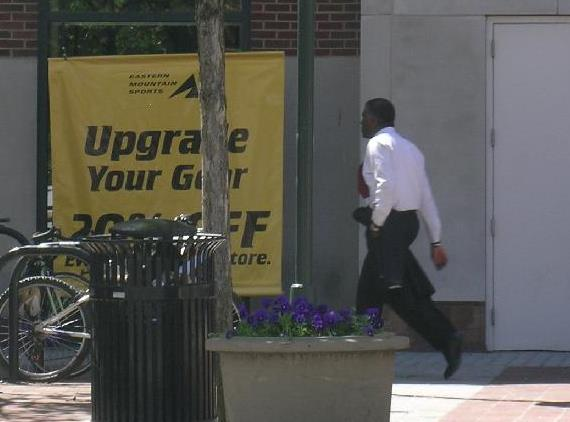

In [ ]:
Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())

And let's now visualize the top predicted segmentation mask. The masks are predicted as `[N, 1, H, W]`, where `N` is the number of predictions, and are probability maps between 0-1.

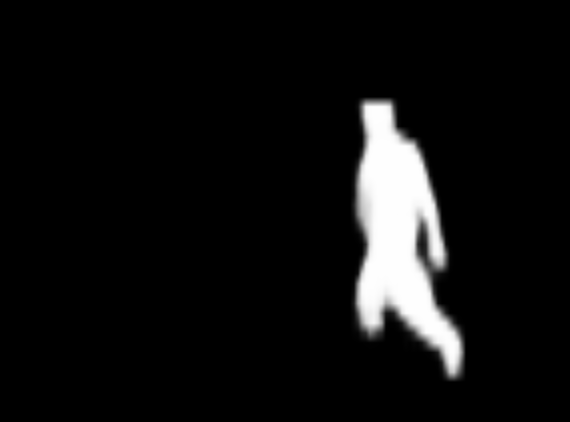

In [ ]:
Image.fromarray(prediction[0]['masks'][0, 0].mul(255).byte().cpu().numpy())

Looks pretty good!

## Wrapping up

In this tutorial, you have learned how to create your own training pipeline for instance segmentation models, on a custom dataset.
For that, you wrote a `torch.utils.data.Dataset` class that returns the images and the ground truth boxes and segmentation masks. You also leveraged a Mask R-CNN model pre-trained on COCO train2017 in order to perform transfer learning on this new dataset.

For a more complete example, which includes multi-machine / multi-gpu training, check `references/detection/train.py`, which is present in the [torchvision GitHub repo](https://github.com/pytorch/vision/tree/v0.8.2/references/detection). 

